In [2]:
import gymnasium as gym
from tetris_gymnasium.envs import Tetris
import numpy as np
import math
import matplotlib.pyplot as plt
from IPython.display import clear_output
import time
import cv2
import sys
from matplotlib.animation import FuncAnimation


In [3]:
i = 0

In [6]:
env = gym.make("tetris_gymnasium/Tetris", render_mode="human")

# 1. MAPA DE ACCIONES (Action Space)
print("Action Space:", env.unwrapped.actions, env.action_space.n)
print("Acciones disponibles:")
print(f"- Move Left: {env.unwrapped.actions.move_left}")
print(f"- Move Right: {env.unwrapped.actions.move_right}")
print(f"- Move Down: {env.unwrapped.actions.move_down}")
print(f"- Rotate Counterclockwise: {env.unwrapped.actions.rotate_counterclockwise}")
print(f"- Rotate Clockwise: {env.unwrapped.actions.rotate_clockwise}")
print(f"- Hard Drop: {env.unwrapped.actions.hard_drop}")
print(f"- Swap: {env.unwrapped.actions.swap}")

# 2. MAPA DE RECOMPENSAS (Rewards)
print("\nRewards:", env.unwrapped.rewards)

# 3. MAPA DE ESTADOS/OBSERVACIONES (Observation Space)
print("\nObservation Space:", env.observation_space)

# Obtener una observación inicial
obs, info = env.reset()
print("Forma de la observación:", obs['board'])

Action Space: ActionsMapping(move_left=0, move_right=1, move_down=2, rotate_clockwise=3, rotate_counterclockwise=4, hard_drop=5, swap=6, no_op=7) 8
Acciones disponibles:
- Move Left: 0
- Move Right: 1
- Move Down: 2
- Rotate Counterclockwise: 4
- Rotate Clockwise: 3
- Hard Drop: 5
- Swap: 6

Rewards: RewardsMapping(alife=1, clear_line=1, game_over=0, invalid_action=-0.1)

Observation Space: Dict('active_tetromino_mask': Box(0, 1, (24, 18), uint8), 'board': Box(0, 9, (24, 18), uint8), 'holder': Box(0, 9, (4, 4), uint8), 'queue': Box(0, 9, (4, 16), uint8))
Forma de la observación: [[1 1 1 1 0 0 0 0 7 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 7 7 7 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
 [1 1 1 1 0 0 0 0 0 0 0 

In [5]:
env.unwrapped.rewards.alife = 0
env.unwrapped.rewards.clear_line = 10
env.unwrapped.rewards.game_over = -2
env.unwrapped.rewards.invalid_action = 0
print("Recompensas:", env.unwrapped.rewards)

Recompensas: RewardsMapping(alife=0, clear_line=10, game_over=-2, invalid_action=0)


In [6]:
def GenerarEstado(obs):
    board = obs["board"]
    board = board.copy()
    board[board > 1] = 2
    board = board[:-4, 4:-4]
    piece = obs["active_tetromino_mask"]
    piece = piece[:-4, 4:-4]
    mask = (board == 2) & (piece == 1)
    piece = np.where(mask, 1, 0)
    board[piece == 1] = 0
    return board, piece

In [ ]:
def ExtraerCaracteristicas(board, piece, extended=False):

    board = np.array(board)
    piece = np.array(piece)
    height, width = board.shape

    piece_rows = np.where(np.any(piece == 1, axis=1))[0]
    if len(piece_rows) > 0:
        altura_pieza = height - np.max(piece_rows)
    else:
        altura_pieza = 0

    piece_coords = np.argwhere(piece == 1)
    if len(piece_coords) > 0:
        max_row = np.max(piece_coords[:, 0])
        bottom_coords = piece_coords[piece_coords[:, 0] == max_row]
        piece_bottom_inicio = np.min(bottom_coords[:, 1])
        piece_bottom_ancho = np.max(bottom_coords[:, 1]) - piece_bottom_inicio + 1
    else:
        piece_bottom_inicio = 0
        piece_bottom_ancho = 0

    column_heights = []
    holes_per_column = []
    for col in range(width):
        occupied_rows = np.where(board[:, col] == 2)[0]
        if len(occupied_rows) > 0:
            column_heights.append(height - occupied_rows[0])
            first_occupied = occupied_rows[0]
            holes = np.sum((board[first_occupied:, col] == 0))
            holes_per_column.append(holes)
        else:
            column_heights.append(0)
            holes_per_column.append(0)

    min_height = min(column_heights)
    min_valley_cols = [i for i, h in enumerate(column_heights) if h == min_height]

    if min_valley_cols:
        tablero_centro = width // 2
        idx_central = np.argmin([abs(c - tablero_centro) for c in min_valley_cols])
        central_col = min_valley_cols[idx_central]

        inicio_valle = central_col
        fin_valle = central_col
        for c in range(central_col - 1, -1, -1):
            if column_heights[c] == min_height:
                inicio_valle = c
            else:
                break
        for c in range(central_col + 1, width):
            if column_heights[c] == min_height:
                fin_valle = c
            else:
                break
    else:
        inicio_valle = fin_valle = -1

    if extended:
        max_height = max(column_heights)

        total_hoyos = sum(holes_per_column)

        rugosidad = sum(abs(column_heights[i] - column_heights[i+1]) for i in range(width-1))

        altura_promedio = np.mean(column_heights)

        es_valle = column_heights < altura_promedio
        valles = []
        inicio = None
        for i, es_v in enumerate(es_valle):
            if es_v and inicio is None:
                inicio = i
            elif not es_v and inicio is not None:
                valles.append((inicio, i - 1))
                inicio = None
        if inicio is not None:
            valles.append((inicio, width - 1))

        if not valles:
            inicio_valle_medio, fin_valle_medio = -1, -1  # No hay valle
        else:
            centro = width // 2
            valle_medio = min(valles, key=lambda v: abs((v[0] + v[1]) / 2 - centro))
            inicio_valle_medio, fin_valle_medio = valle_medio

        piece_cols = np.where(np.any(piece == 1, axis=0))[0]
        if len(piece_cols) > 0:
            ancho_total_pieza = np.max(piece_cols) - np.min(piece_cols) + 1
        else:
            ancho_total_pieza = 0

        columnas_llenas = sum(1 for h in column_heights if h == max_height)

        return (inicio_valle, fin_valle, piece_bottom_inicio, piece_bottom_ancho, altura_pieza, ancho_total_pieza,
                inicio_valle_medio, fin_valle_medio, rugosidad, total_hoyos, altura_promedio,
                columnas_llenas)

    return (inicio_valle, fin_valle, piece_bottom_inicio, piece_bottom_ancho, altura_pieza)


In [ ]:
def CalcularRecompensa(estado, debug = False, extended=False):
    inicio_valle, fin_valle, piece_bottom_inicio, piece_bottom_ancho, altura_pieza = estado[:5]

    if inicio_valle == -1 or fin_valle == -1:
        return 0

    ancho_valle = fin_valle - inicio_valle + 1
    piece_bottom_fin = piece_bottom_inicio + piece_bottom_ancho - 1
    recompensa = 0

    if piece_bottom_ancho == ancho_valle:
        recompensa += 1.0
        if debug:
            print("Recompensa + 1: Pieza encaja perfectamente en el valle.")
    if piece_bottom_ancho <= ancho_valle:
        exceso_izq = max(0, inicio_valle - piece_bottom_inicio)
        exceso_der = max(0, piece_bottom_ancho - fin_valle)
        exceso_total = exceso_izq + exceso_der
        recompensa -= 0.5 * exceso_total  
        if piece_bottom_inicio == inicio_valle:
            recompensa += 1
            if debug:
                print("Recompensa + 1: Pieza alineada al inicio del valle.")
        if piece_bottom_fin == fin_valle:
            recompensa += 1
            if debug:
                print("Recompensa + 1: Pieza alineada al final del valle.")

    if extended:
        ancho_total_pieza, inicio_valle_medio, fin_valle_medio, rugosidad, total_hoyos, altura_promedio, columnas_llenas = estado[5:]
        if inicio_valle_medio  == -1 or fin_valle_medio == -1:
            return 0
        if ancho_total_pieza <= (fin_valle_medio - inicio_valle_medio + 1):
            recompensa += 1.5
            if debug:
                print("Recompensa +1.5: Ancho total de la pieza igual al ancho del valle medio.")
        recompensa += (10 - rugosidad) * 0.05
        if debug and rugosidad < 10:
            print(f"Recompensa +{(10 - rugosidad) * 0.05:.2f}: Rugosidad baja ({rugosidad}).")
        recompensa += (5 - total_hoyos) * 0.1
        if debug and total_hoyos < 5:
            print(f"Recompensa +{(5 - total_hoyos) * 0.1:.2f}: Pocos hoyos ({total_hoyos}).")

        (8 - altura_promedio) * 0.05
        if debug and altura_promedio < 8:
            print(f"Recompensa +{(8 - altura_promedio) * 0.05:.2f}: Altura promedio baja ({altura_promedio:.2f}).")

        recompensa -= columnas_llenas * 0.1
        if debug and columnas_llenas > 0:
            print(f"Recompensa +{columnas_llenas * 0.1:.2f}: Columnas llenas ({columnas_llenas}).")



    return recompensa


# Deep Q-Learning

In [ ]:
import torch
from collections import deque
import random

import torch.nn as nn
import torch.optim as optim

class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim)
        )

    def forward(self, x):
        return self.net(x)

def TetrisTrainDQN(episodes=2000, max_steps=500, gamma=0.99, epsilon_start=1.0, epsilon_end=0.1, epsilon_decay=0.995, lr=1e-3, batch_size=64, memory_size=10000, target_update=10, policy=False):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    env = gym.make("tetris_gymnasium/Tetris")
    n_actions = env.action_space.n
    state_dim = 12

    policy_net = DQN(state_dim, n_actions).to(device)
    if policy:
        policy_net.load_state_dict(torch.load('tetris_dqn_v2.pth'))
    target_net = DQN(state_dim, n_actions).to(device)
    target_net.load_state_dict(policy_net.state_dict())
    target_net.eval()

    optimizer = optim.Adam(policy_net.parameters(), lr=lr)
    memory = deque(maxlen=memory_size)

    epsilon = epsilon_start
    rewards_history = []

    def get_state(obs):
        board, piece = GenerarEstado(obs)
        return np.array(ExtraerCaracteristicas(board, piece, extended=True), dtype=np.float32)

    for episode in range(episodes):
        obs, info = env.reset(seed=42)
        state = get_state(obs)
        total_reward = 0
        done = False
        steps = 0

        while not done and steps < max_steps:
            if random.random() < epsilon:
                action = env.action_space.sample()
                while action == env.unwrapped.actions.swap:
                    action = env.action_space.sample()
            else:
                with torch.no_grad():
                    state_tensor = torch.tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
                    q_values = policy_net(state_tensor)
                    action = q_values.argmax().item()

            obs_next, reward, done, truncated, info = env.step(action)
            next_state = get_state(obs_next)
            reward += CalcularRecompensa(ExtraerCaracteristicas(*GenerarEstado(obs_next), extended=True), extended=True)
            memory.append((state, action, reward, next_state, done or truncated))
            state = next_state
            total_reward += reward
            steps += 1
            if truncated:
                done = True

            # Train
            if len(memory) >= batch_size:
                batch = random.sample(memory, batch_size)
                states, actions, rewards, next_states, dones = zip(*batch)
                states = torch.tensor(states, dtype=torch.float32, device=device)
                actions = torch.tensor(actions, dtype=torch.int64, device=device).unsqueeze(1)
                rewards = torch.tensor(rewards, dtype=torch.float32, device=device).unsqueeze(1)
                next_states = torch.tensor(next_states, dtype=torch.float32, device=device)
                dones = torch.tensor(dones, dtype=torch.float32, device=device).unsqueeze(1)

                q_values = policy_net(states).gather(1, actions)
                with torch.no_grad():
                    max_next_q = target_net(next_states).max(1, keepdim=True)[0]
                    target = rewards + gamma * max_next_q * (1 - dones)
                loss = nn.MSELoss()(q_values, target)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        rewards_history.append(total_reward)
        epsilon = max(epsilon_end, epsilon * epsilon_decay)

        if (episode + 1) % target_update == 0:
            target_net.load_state_dict(policy_net.state_dict())

        if (episode + 1) % 100 == 0:
            print(f"Episode {episode+1}/{episodes} | Reward: {total_reward:.2f} | Epsilon: {epsilon:.3f}")

    env.close()
    torch.save(policy_net.state_dict(), "tetris_dqn_v3.pth")
    return {
        'policy_net': policy_net,
        'rewards_history': rewards_history,
        'n_actions': n_actions,
        'state_dim': state_dim
    }

In [ ]:
import torch
from IPython.display import clear_output
import time

def VisualizarAgenteDQN(resultados_dqn, max_pasos=500, time_wait=0.3):
    """
    Visualiza un juego usando una red DQN ya entrenada.
    """
    import matplotlib.pyplot as plt

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    policy_net = resultados_dqn['policy_net']
    # n_actions = resultados_dqn['n_actions']

    env = gym.make("tetris_gymnasium/Tetris", render_mode="human")
    obs, info = env.reset()
    board, piece = GenerarEstado(obs)
    estado = np.array(ExtraerCaracteristicas(board, piece, extended=True), dtype=np.float32)

    recompensa_total = 0
    pasos = 0
    terminado = False

    while not terminado and pasos < max_pasos:
        env.render()
        key = cv2.waitKey(1)
        time.sleep(time_wait)

        with torch.no_grad():
            state_tensor = torch.tensor(estado, dtype=torch.float32, device=device).unsqueeze(0)
            q_values = policy_net(state_tensor)
            accion = q_values.argmax().item()

        obs, recompensa, terminado, truncado, info = env.step(accion)
        board, piece = GenerarEstado(obs)
        estado = np.array(ExtraerCaracteristicas(board, piece, extended=True), dtype=np.float32)
        recompensa += CalcularRecompensa(ExtraerCaracteristicas(board, piece, extended=True))
        recompensa_total += recompensa
        pasos += 1

        if truncado:
            terminado = True

    env.close()
    print(f"\n¡Juego terminado!")
    print(f"Pasos totales: {pasos}")
    print(f"Recompensa total: {recompensa_total:.2f}")

    return recompensa_total, pasos

# SARSA

In [21]:
def generar_preboard_aleatorio(filas=20, columnas=10, min_altura=0, max_altura=10, min_hueco=1, max_hueco=8):

    altura = np.random.randint(min_altura, max_altura + 1)
    hueco_anchura = np.random.randint(min_hueco, min(max_hueco, columnas) + 1)
    hueco_inicio = np.random.randint(0, columnas - hueco_anchura + 1)
    
    preboard = np.zeros((filas, columnas), dtype=np.uint8)
    # Llenar hasta la altura
    for f in range(filas - altura, filas):
        preboard[f, :] = 2
        preboard[f, hueco_inicio:hueco_inicio + hueco_anchura] = 0
    return preboard

generar_preboard_aleatorio()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 2, 2, 2, 2, 2, 2]], dtype=uint8)

In [ ]:
def TetrisTrainSARSA(epsilon = 0.5, partidas = 5000, max_pasos_por_partida = 500, record = True, preb = True):
    
    alpha = 0.1
    gamma = 0.9  
    epsilons = [epsilon] 
    
    env = gym.make("tetris_gymnasium/Tetris", render_mode='rgb_array' if record else 'human')
    n_acciones = env.action_space.n
    
    recompensas_acumuladas = np.zeros((len(epsilons), partidas))
    pasos_por_partida = np.zeros((len(epsilons), partidas))
    acciones_seleccionadas = np.zeros((len(epsilons), partidas, n_acciones))
    Qs_por_epsilon = []
    preboard = None

    for i, epsilon in enumerate(epsilons):
        print(f"\nEntrenando con epsilon = {epsilon}")
        Q = {}
        for partida in range(partidas):
            acciones_count = np.zeros(n_acciones)
            if preb:
                preboard = generar_preboard_aleatorio()
            obs, info = env.reset()
            if preboard is not None:
                board = env.unwrapped.board.copy()
                board = np.array(board)
                board[:-4, 4:-4] += np.array(preboard, dtype=board.dtype)
                env.unwrapped.board = board.copy()
                obs["board"] = np.array(obs["board"])
                obs["board"][:-4, 4:-4] += np.array(preboard, dtype=obs["board"].dtype)
            board, piece = GenerarEstado(obs)
            estado = ExtraerCaracteristicas(board, piece)
            recompensa_total = 0
            pasos = 0
            terminado = False

            if estado not in Q:
                Q[estado] = np.zeros(n_acciones)

            mostrar_partida = ((partida + 1) % 500 == 0)
            if mostrar_partida and record:
                print(f"\nVisualizando partida {partida + 1}...")
            
            if np.random.uniform(0, 1) < epsilon:
                accion = np.argmin(Q[estado]) 
            else:
                accion = np.argmax(Q[estado])

            while not terminado and pasos < max_pasos_por_partida:
                obs_next, recompensa, terminado, truncado, info = env.step(accion)
                if recompensa == 10 and accion == 5:
                    recompensa += 10 
                board_next, piece_next = GenerarEstado(obs_next)
                estado_next = ExtraerCaracteristicas(board_next, piece_next)
                recompensa += CalcularRecompensa(estado_next)

                board_array_prev = np.array(board)
                board_array_next = np.array(board_next)
                hoyos_prev = 0
                hoyos_next = 0
                for col in range(board_array_prev.shape[1]):
                    columna_prev = board_array_prev[:, col]
                    columna_next = board_array_next[:, col]
                    bloque_encontrado_prev = False
                    bloque_encontrado_next = False
                    for celda in columna_prev:
                        if celda != 0:
                            bloque_encontrado_prev = True
                        elif bloque_encontrado_prev and celda == 0:
                            hoyos_prev += 1
                    for celda in columna_next:
                        if celda != 0:
                            bloque_encontrado_next = True
                        elif bloque_encontrado_next and celda == 0:
                            hoyos_next += 1
                nuevos_hoyos = hoyos_next - hoyos_prev
                if nuevos_hoyos > 0:
                    recompensa -= nuevos_hoyos * 2

                if estado_next not in Q:
                    Q[estado_next] = np.zeros(n_acciones)

                if np.random.uniform(0, 1) < epsilon:
                    accion_next = np.argmin(Q[estado_next])  
                else:
                    accion_next = np.argmax(Q[estado_next])

                if estado in Q:
                    Q[estado][accion] += alpha * (
                        recompensa + gamma * Q[estado_next][accion_next] * (not terminado) - Q[estado][accion]
                    )
                    
                acciones_count[accion] += 1

                if mostrar_partida and record:
                    frame = env.render()
                    plt.figure(figsize=(6, 8))
                    plt.imshow(frame)
                    plt.axis('off')
                    plt.title(f'Partida {partida+1} | Paso: {pasos} | Recompensa: {recompensa_total:.2f}\n'
                              f'Valle central: {estado_next[0]}, {estado_next[1]} - Base pieza: {estado_next[2]}, {estado_next[3]} '
                              f'Altura máxima: {estado_next[4]} Hoyos: {estado_next[5]}')
                    clear_output(wait=True)
                    plt.show()
                    time.sleep(1)
                
                estado = estado_next
                accion = accion_next
                recompensa_total += recompensa
                pasos += 1


                if truncado:
                    terminado = True
            
            recompensas_acumuladas[i, partida] = recompensa_total
            pasos_por_partida[i, partida] = pasos
            acciones_seleccionadas[i, partida] = acciones_count
            
            if (partida + 1) % 1000 == 0:
                print(f"  Partida {partida + 1}/{partidas} - "
                      f"Recompensa: {recompensa_total:.2f}, "
                      f"Pasos: {pasos}")
        Qs_por_epsilon.append(Q.copy()) 
    env.close()
    
    return {
        'epsilons': epsilons,
        'recompensas_acumuladas': recompensas_acumuladas,
        'pasos_por_partida': pasos_por_partida,
        'acciones_seleccionadas': acciones_seleccionadas,
        'n_acciones': n_acciones,
        'Qs_por_epsilon': Qs_por_epsilon
    }

# Analisis

In [11]:
def Analisis(resultados):

    epsilons = resultados['epsilons']
    recompensas = resultados['recompensas_acumuladas']
    pasos = resultados['pasos_por_partida']
    acciones = resultados['acciones_seleccionadas']
    n_acciones = resultados['n_acciones']

    print("\n" + "="*60)
    print("RESULTADOS DEL ENTRENAMIENTO")
    print("="*60)
    
    for i, eps in enumerate(epsilons):
        recomp_media = np.mean(recompensas[i])
        recomp_std = np.std(recompensas[i])
        pasos_media = np.mean(pasos[i])
        pasos_std = np.std(pasos[i])
        
        print(f"\nEpsilon = {eps}:")
        print(f"  Recompensa promedio: {recomp_media:.2f} - {recomp_std:.2f}")
        print(f"  Pasos promedio: {pasos_media:.2f} - {pasos_std:.2f}")
        print(f"  Mejor partida: {np.max(recompensas[i]):.2f}")
        print(f"  Peor partida: {np.min(recompensas[i]):.2f}")

    print(f"\n" + "="*40)
    print("ANÁLISIS DE ACCIONES")
    print("="*40)
    
    for i, eps in enumerate(epsilons):
        acciones_totales = np.sum(acciones[i], axis=0)
        acciones_promedio = acciones_totales / len(recompensas[i])
        
        print(f"\nEpsilon = {eps} - Uso promedio de acciones:")
        for j in range(n_acciones):
            porcentaje = (acciones_promedio[j] / np.sum(acciones_promedio)) * 100
            print(f"  Acción {j}: {acciones_promedio[j]:.1f} veces ({porcentaje:.1f}%)")
    
    return recompensas, pasos

In [12]:
def Visualizacion(recompensas, pasos, epsilons):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 5))
    
    for i, eps in enumerate(epsilons):
        ax1.plot(recompensas[i], label=f'Eps = {eps}', alpha=0.7)
    ax1.set_xlabel('Partida')
    ax1.set_ylabel('Recompensa Acumulada')
    ax1.set_title('Recompensas por Partida')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    for i, eps in enumerate(epsilons):
        ax2.plot(pasos[i], label=f'Eps = {eps}', alpha=0.7)
    ax2.set_xlabel('Partida')
    ax2.set_ylabel('Pasos por Partida')
    ax2.set_title('Duración de Partidas')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


# Ejecucion

Iniciando entrenamiento del agente Tetris con método acción-valor...

Entrenando con epsilon = 0.5
  Partida 1000/50000 - Recompensa: 5.50, Pasos: 10
  Partida 2000/50000 - Recompensa: 0.00, Pasos: 10
  Partida 3000/50000 - Recompensa: 0.50, Pasos: 10
  Partida 4000/50000 - Recompensa: 16.50, Pasos: 10
  Partida 5000/50000 - Recompensa: 1.00, Pasos: 10
  Partida 6000/50000 - Recompensa: 6.00, Pasos: 10
  Partida 7000/50000 - Recompensa: -3.50, Pasos: 10
  Partida 8000/50000 - Recompensa: 0.00, Pasos: 10
  Partida 9000/50000 - Recompensa: -3.50, Pasos: 10
  Partida 10000/50000 - Recompensa: -46.00, Pasos: 10
  Partida 11000/50000 - Recompensa: 3.00, Pasos: 10
  Partida 12000/50000 - Recompensa: 16.00, Pasos: 10
  Partida 13000/50000 - Recompensa: -466.50, Pasos: 10
  Partida 14000/50000 - Recompensa: 3.00, Pasos: 10
  Partida 15000/50000 - Recompensa: -36.00, Pasos: 10
  Partida 16000/50000 - Recompensa: -70.50, Pasos: 10
  Partida 17000/50000 - Recompensa: -12.00, Pasos: 10
  Partida 1

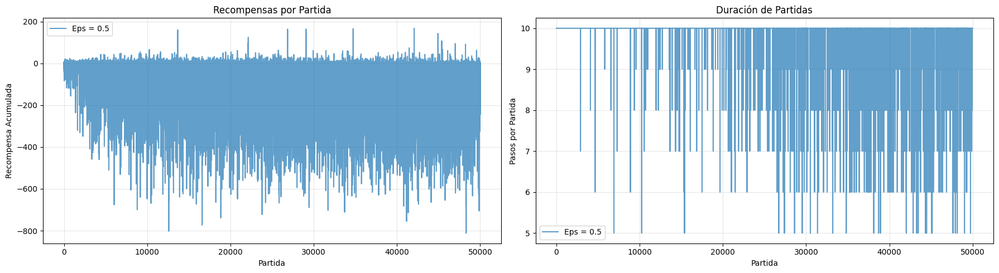


Entrenamiento completado!


In [22]:
print("Iniciando entrenamiento del agente Tetris con método acción-valor...")

resultados = TetrisTrainSARSA(epsilon = 0.5, partidas=50000, max_pasos_por_partida=10, record=False, preb=True)
recompensas, pasos = Analisis(resultados)
Visualizacion(recompensas, pasos, resultados['epsilons'])

print("\nEntrenamiento completado!")

In [44]:
print("Iniciando entrenamiento del agente Tetris con deep Q-learning...")
resultados_dqn = TetrisTrainDQN(episodes=1000, max_steps=200, gamma=0.99, epsilon_start=1.0, epsilon_end=0.1, epsilon_decay=0.995, lr=1e-3, batch_size=64, memory_size=10000, target_update=10)

Iniciando entrenamiento del agente Tetris con deep Q-learning...
Episode 100/1000 | Reward: 60.50 | Epsilon: 0.606
Episode 200/1000 | Reward: -42.80 | Epsilon: 0.367
Episode 300/1000 | Reward: 70.25 | Epsilon: 0.222
Episode 400/1000 | Reward: 154.90 | Epsilon: 0.135
Episode 500/1000 | Reward: 166.30 | Epsilon: 0.100
Episode 600/1000 | Reward: 198.25 | Epsilon: 0.100
Episode 700/1000 | Reward: -7.50 | Epsilon: 0.100
Episode 800/1000 | Reward: 161.25 | Epsilon: 0.100
Episode 900/1000 | Reward: 22.15 | Epsilon: 0.100
Episode 1000/1000 | Reward: 224.10 | Epsilon: 0.100


In [28]:
def VisualizarAgenteEntrenado(Q_table, epsilon_usado=0, max_pasos=500, preboard=None, time_wait = 0.3):
    """
    Visualiza un juego usando una tabla Q ya entrenada
    """
    import matplotlib.pyplot as plt
    from IPython.display import clear_output
    import time
    
    env = gym.make("tetris_gymnasium/Tetris", render_mode="human")
    
    obs, info = env.reset()
    if preboard is not None:
        board = env.unwrapped.board.copy()
        board = np.array(board)
        board[:-4, 4:-4] += np.array(preboard, dtype=board.dtype)
        env.unwrapped.board = board.copy()
        obs["board"] = np.array(obs["board"])
        obs["board"][:-4, 4:-4] += np.array(preboard, dtype=obs["board"].dtype)
    board, piece = GenerarEstado(obs)
    estado = ExtraerCaracteristicas(board, piece)

    recompensa_total = 0
    pasos = 0
    terminado = False
    
    print(f"Iniciando juego con agente entrenado (epsilon original: {epsilon_usado})")
    print(f"Tabla Q: {Q_table}")
    
    while not terminado and pasos < max_pasos:
        # Renderizar el frame
        env.render()
        key = cv2.waitKey(1)
        time.sleep(time_wait)
        
        if estado in Q_table:
            q_values = Q_table[estado]
            accion = np.argmax(q_values)
            tipo_accion = f"Q-learning (Q={q_values[accion]:.2f})"
        else:
            accion = env.action_space.sample()
            tipo_accion = "Exploración aleatoria"
        print(f" Acción: {accion} ({tipo_accion})")

        obs, recompensa, terminado, truncado, info = env.step(accion)

        board, piece = GenerarEstado(obs)
        estado = ExtraerCaracteristicas(board, piece)

        recompensa += CalcularRecompensa(estado, debug=True)
        
        recompensa_total += recompensa
        pasos += 1
        
        if truncado:
            terminado = True
    
    print(f"\n¡Juego terminado!")
    print(f"Pasos totales: {pasos}")
    print(f"Recompensa total: {recompensa_total:.2f}")
    
    env.close()
    
    return recompensa_total, pasos

In [50]:
dqnPolicy = {}
policy_net = DQN(12, 8).to('cuda')
policy_net.load_state_dict(torch.load('tetris_dqn_v2.pth'))
dqnPolicy['policy_net'] = policy_net
dqnPolicy['policy_net'].eval()  # Asegurarse de que la red está en modo evaluación
# VisualizarAgenteDQN(resultados_dqn, max_pasos=500, time_wait=0.3)

DQN(
  (net): Sequential(
    (0): Linear(in_features=12, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=8, bias=True)
  )
)

In [29]:

Qs_por_epsilon = resultados['Qs_por_epsilon']
indice_epsilon = 0
epsilon_usado = 0.8

resultado = VisualizarAgenteEntrenado(
    Q_table=Qs_por_epsilon[indice_epsilon], 
    epsilon_usado=epsilon_usado,
    time_wait=0.3,
    preboard=generar_preboard_aleatorio(min_altura=1, max_altura=1, max_hueco=4)
)

Iniciando juego con agente entrenado (epsilon original: 0.8)
Tabla Q: {(2, 5, 4, 2, 19): array([ -1.66056115,  -1.32795593,  -2.74414554,  -3.72575798,
        -1.6715949 , -50.81261383,  -1.03803187,  -2.04892079]), (2, 5, 3, 2, 18): array([-0.80145409,  0.10081   ,  0.04113197, -3.85907425,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 2, 2, 17): array([-0.14806307, -1.33105098,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 1, 2, 16): array([-0.1       ,  0.26255762,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 0, 2, 15): array([-0.1,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ]), (2, 5, 0, 2, 14): array([-0.1,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ]), (2, 5, 0, 2, 13): array([-0.28      , -0.08774609,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 0, 2, 12): array([-0.271, -0.05 , -0.1  ,  0.   ,  0.   ,  0.   ,  0.   , 

In [ ]:
import tkinter as tk

def visualizar_dqn():
    # Aquí llama a tu función de visualización DQN
    print("Visualizando agente DQN...")
    VisualizarAgenteDQN(dqnPolicy, max_pasos=500, time_wait=0.3)

def visualizar_sarsa():
    # Aquí llama a tu función de visualización SARSA
    print("Visualizando agente SARSA...")
    VisualizarAgenteEntrenado(
        Q_table=resultados['Qs_por_epsilon'][0],
        epsilon_usado=0.5,
        time_wait=0.3,
        # preboard=generar_preboard_aleatorio(min_altura=1, max_altura=1, max_hueco=4)
    )

root = tk.Tk()
root.title("Visualización de Agentes Tetris")

btn_sarsa = tk.Button(root, text="Visualizar Agente Q-Learning", command=visualizar_sarsa, width=30, height=2)
btn_sarsa.pack(pady=10)

btn_dqn = tk.Button(root, text="Visualizar Agente DQN", command=visualizar_dqn, width=30, height=2)
btn_dqn.pack(pady=10)


root.mainloop()

Visualizando agente SARSA...
Iniciando juego con agente entrenado (epsilon original: 0.5)
Tabla Q: {(2, 5, 4, 2, 19): array([ -1.66056115,  -1.32795593,  -2.74414554,  -3.72575798,
        -1.6715949 , -50.81261383,  -1.03803187,  -2.04892079]), (2, 5, 3, 2, 18): array([-0.80145409,  0.10081   ,  0.04113197, -3.85907425,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 2, 2, 17): array([-0.14806307, -1.33105098,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 1, 2, 16): array([-0.1       ,  0.26255762,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 0, 2, 15): array([-0.1,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ]), (2, 5, 0, 2, 14): array([-0.1,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ,  0. ]), (2, 5, 0, 2, 13): array([-0.28      , -0.08774609,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ]), (2, 5, 0, 2, 12): array([-0.271, -0.05 , -0.1  ,  0.

: 